In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,confusion_matrix
plt.style.use('dark_background')

In [2]:
dataset = pd.read_csv('labels_transactionsagg.csv')
dataset

,Unnamed: 0,address,label,n_transactions,block_height_max-min,fee_mean,fee_median,fee_std,fee_min,fee_max,...,inputsAmount_mean,inputsAmount_median,inputsAmount_std,inputsAmount_min,inputsAmount_max,outputsAmount_mean,outputsAmount_median,outputsAmount_std,outputsAmount_min,outputsAmount_max
0,0,1129yN1itF5a5Hqgw7aenPKrom3fv8Aid1,coinjoin-like,100,31865.0,1.630440e+07,10000.0,1.619901e+08,0.0,1.620000e+09,...,1.313290e+09,8.238289e+07,5.182520e+09,5987183,41851030020,1.296986e+09,8.236789e+07,5.055408e+09,5977183,40231030020
1,1,112b8ZjaJWGobxT7rAE8Qyw17bJa91jaec,gambling,72,8031.0,2.778860e+04,10000.0,6.649439e+04,0.0,4.500000e+05,...,1.210478e+08,3.567693e+06,3.049818e+08,30070,1544801456,1.210200e+08,3.552693e+06,3.049775e+08,70,1544801456
2,2,112LhEwGZk5mqpLz9Q33QG5FxZNbpgDwTL,exchange,3,1919.0,1.679267e+05,67200.0,2.338156e+05,1356.0,4.352240e+05,...,1.333763e+09,5.242000e+07,2.264819e+09,93531,3948775856,1.333595e+09,5.235280e+07,2.264587e+09,92175,3948340632
3,3,1136GYGTdySKCocdjqZphXiW4zoskXHqML,gambling,197,119799.0,2.498390e+05,40000.0,1.402504e+06,744.0,1.000000e+07,...,5.490793e+08,1.229547e+07,1.625851e+09,603092,11002000000,5.488295e+08,1.228344e+07,1.625317e+09,529092,11001956800
4,4,113Nu2g1dE4d3oiUH1ozUysK2RBgC98pxx,miner,6,4238.0,5.135067e+06,6120522.0,4.338964e+06,24034.0,9.817000e+06,...,3.525227e+09,1.687865e+09,4.839984e+09,49374220,13007866685,3.520092e+09,1.683758e+09,4.839671e+09,49350186,13003684841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8803,8803,3QyoEdgBWFuCLsT877ikP5U4ygj7vAPTix,miner,250,53066.0,1.189897e+06,525000.0,1.763104e+06,20000.0,1.135000e+07,...,6.237457e+09,4.600000e+08,1.697510e+10,100899,134962694687,6.236267e+09,4.591555e+08,1.697457e+10,29379,134961594687
8804,8804,3QZ6EB4ryNN4qrUMv2KNsmNUyRBdwevwYw,miner,2,2.0,1.911040e+05,191104.0,2.570828e+05,9319.0,3.728890e+05,...,9.189804e+08,9.189804e+08,1.269385e+09,21389592,1816571142,9.187893e+08,9.187893e+08,1.269128e+09,21380273,1816198253
8805,8805,3QzDH6TTQ18Jd72to6rLnME2t37VaERmnn,services,2,7.0,6.257700e+04,62577.0,8.689918e+04,1130.0,1.240240e+05,...,3.892433e+07,3.892433e+07,5.412172e+07,654499,77194167,3.886176e+07,3.886176e+07,5.403482e+07,653369,77070143
8806,8806,3QZjR2jkRE7fVHrjaaD31e6o1q17XWku99,miner,10,939.0,5.031850e+05,491075.0,2.722570e+05,100000.0,8.482500e+05,...,3.706774e+10,4.818059e+09,1.033811e+11,419557304,331192567341,3.706724e+10,4.817438e+09,1.033811e+11,418919954,331192034991


In [3]:
dataset.info()
dataset.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8808 entries, 0 to 8807
Data columns (total 46 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8808 non-null   int64  
 1   address               8808 non-null   object 
 2   label                 8808 non-null   object 
 3   n_transactions        8808 non-null   int64  
 4   block_height_max-min  8808 non-null   float64
 5   fee_mean              8808 non-null   float64
 6   fee_median            8808 non-null   float64
 7   fee_std               8802 non-null   float64
 8   fee_min               8808 non-null   float64
 9   fee_max               8808 non-null   float64
 10  fee_max-min           8808 non-null   float64
 11  size_mean             8808 non-null   float64
 12  size_median           8808 non-null   float64
 13  size_std              8802 non-null   float64
 14  size_min              8808 non-null   float64
 15  size_max             

Unnamed: 0              0
address                 0
label                   0
n_transactions          0
block_height_max-min    0
fee_mean                0
fee_median              0
fee_std                 6
fee_min                 0
fee_max                 0
fee_max-min             0
size_mean               0
size_median             0
size_std                6
size_min                0
size_max                0
weight_mean             0
weight_median           0
weight_std              6
weight_min              0
weight_max              0
confirmations_mean      0
confirmations_median    0
confirmations_std       6
confirmations_min       0
confirmations_max       0
vin_sz_mean             0
vin_sz_median           0
vin_sz_std              6
vin_sz_min              0
vin_sz_max              0
vout_sz_mean            0
vout_sz_median          0
vout_sz_std             6
vout_sz_min             0
vout_sz_max             0
inputsAmount_mean       0
inputsAmount_median     0
inputsAmount

In [4]:
dataset.nunique()

Unnamed: 0              8808
address                 8808
label                      6
n_transactions           249
block_height_max-min    6106
fee_mean                8212
fee_median              6377
fee_std                 8190
fee_min                 3470
fee_max                 4126
fee_max-min             7373
size_mean               7900
size_median             5133
size_std                7909
size_min                1001
size_max                4388
weight_mean             7967
weight_median           5522
weight_std              7961
weight_min              1162
weight_max              4411
confirmations_mean      6778
confirmations_median    6196
confirmations_std       6714
confirmations_min       5021
confirmations_max       5760
vin_sz_mean             5119
vin_sz_median            297
vin_sz_std              6279
vin_sz_min                58
vin_sz_max               674
vout_sz_mean            4309
vout_sz_median           328
vout_sz_std             5609
vout_sz_min   

In [5]:
dataset.drop(['Unnamed: 0','address'],axis=1,inplace=True)
dataset

,label,n_transactions,block_height_max-min,fee_mean,fee_median,fee_std,fee_min,fee_max,fee_max-min,size_mean,...,inputsAmount_mean,inputsAmount_median,inputsAmount_std,inputsAmount_min,inputsAmount_max,outputsAmount_mean,outputsAmount_median,outputsAmount_std,outputsAmount_min,outputsAmount_max
0,coinjoin-like,100,31865.0,1.630440e+07,10000.0,1.619901e+08,0.0,1.620000e+09,1.620000e+09,6232.800000,...,1.313290e+09,8.238289e+07,5.182520e+09,5987183,41851030020,1.296986e+09,8.236789e+07,5.055408e+09,5977183,40231030020
1,gambling,72,8031.0,2.778860e+04,10000.0,6.649439e+04,0.0,4.500000e+05,4.500000e+05,2308.416667,...,1.210478e+08,3.567693e+06,3.049818e+08,30070,1544801456,1.210200e+08,3.552693e+06,3.049775e+08,70,1544801456
2,exchange,3,1919.0,1.679267e+05,67200.0,2.338156e+05,1356.0,4.352240e+05,4.338680e+05,3122.666667,...,1.333763e+09,5.242000e+07,2.264819e+09,93531,3948775856,1.333595e+09,5.235280e+07,2.264587e+09,92175,3948340632
3,gambling,197,119799.0,2.498390e+05,40000.0,1.402504e+06,744.0,1.000000e+07,9.999256e+06,4060.101523,...,5.490793e+08,1.229547e+07,1.625851e+09,603092,11002000000,5.488295e+08,1.228344e+07,1.625317e+09,529092,11001956800
4,miner,6,4238.0,5.135067e+06,6120522.0,4.338964e+06,24034.0,9.817000e+06,9.792966e+06,49573.500000,...,3.525227e+09,1.687865e+09,4.839984e+09,49374220,13007866685,3.520092e+09,1.683758e+09,4.839671e+09,49350186,13003684841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8803,miner,250,53066.0,1.189897e+06,525000.0,1.763104e+06,20000.0,1.135000e+07,1.133000e+07,16994.236000,...,6.237457e+09,4.600000e+08,1.697510e+10,100899,134962694687,6.236267e+09,4.591555e+08,1.697457e+10,29379,134961594687
8804,miner,2,2.0,1.911040e+05,191104.0,2.570828e+05,9319.0,3.728890e+05,3.635700e+05,6860.000000,...,9.189804e+08,9.189804e+08,1.269385e+09,21389592,1816571142,9.187893e+08,9.187893e+08,1.269128e+09,21380273,1816198253
8805,services,2,7.0,6.257700e+04,62577.0,8.689918e+04,1130.0,1.240240e+05,1.228940e+05,6815.500000,...,3.892433e+07,3.892433e+07,5.412172e+07,654499,77194167,3.886176e+07,3.886176e+07,5.403482e+07,653369,77070143
8806,miner,10,939.0,5.031850e+05,491075.0,2.722570e+05,100000.0,8.482500e+05,7.482500e+05,4925.100000,...,3.706774e+10,4.818059e+09,1.033811e+11,419557304,331192567341,3.706724e+10,4.817438e+09,1.033811e+11,418919954,331192034991


In [6]:
dataset.isna().sum()

label                   0
n_transactions          0
block_height_max-min    0
fee_mean                0
fee_median              0
fee_std                 6
fee_min                 0
fee_max                 0
fee_max-min             0
size_mean               0
size_median             0
size_std                6
size_min                0
size_max                0
weight_mean             0
weight_median           0
weight_std              6
weight_min              0
weight_max              0
confirmations_mean      0
confirmations_median    0
confirmations_std       6
confirmations_min       0
confirmations_max       0
vin_sz_mean             0
vin_sz_median           0
vin_sz_std              6
vin_sz_min              0
vin_sz_max              0
vout_sz_mean            0
vout_sz_median          0
vout_sz_std             6
vout_sz_min             0
vout_sz_max             0
inputsAmount_mean       0
inputsAmount_median     0
inputsAmount_std        6
inputsAmount_min        0
inputsAmount

In [7]:
LE = LabelEncoder()
dataset['label'] = LE.fit_transform(dataset['label'])
dataset

,label,n_transactions,block_height_max-min,fee_mean,fee_median,fee_std,fee_min,fee_max,fee_max-min,size_mean,...,inputsAmount_mean,inputsAmount_median,inputsAmount_std,inputsAmount_min,inputsAmount_max,outputsAmount_mean,outputsAmount_median,outputsAmount_std,outputsAmount_min,outputsAmount_max
0,0,100,31865.0,1.630440e+07,10000.0,1.619901e+08,0.0,1.620000e+09,1.620000e+09,6232.800000,...,1.313290e+09,8.238289e+07,5.182520e+09,5987183,41851030020,1.296986e+09,8.236789e+07,5.055408e+09,5977183,40231030020
1,2,72,8031.0,2.778860e+04,10000.0,6.649439e+04,0.0,4.500000e+05,4.500000e+05,2308.416667,...,1.210478e+08,3.567693e+06,3.049818e+08,30070,1544801456,1.210200e+08,3.552693e+06,3.049775e+08,70,1544801456
2,1,3,1919.0,1.679267e+05,67200.0,2.338156e+05,1356.0,4.352240e+05,4.338680e+05,3122.666667,...,1.333763e+09,5.242000e+07,2.264819e+09,93531,3948775856,1.333595e+09,5.235280e+07,2.264587e+09,92175,3948340632
3,2,197,119799.0,2.498390e+05,40000.0,1.402504e+06,744.0,1.000000e+07,9.999256e+06,4060.101523,...,5.490793e+08,1.229547e+07,1.625851e+09,603092,11002000000,5.488295e+08,1.228344e+07,1.625317e+09,529092,11001956800
4,3,6,4238.0,5.135067e+06,6120522.0,4.338964e+06,24034.0,9.817000e+06,9.792966e+06,49573.500000,...,3.525227e+09,1.687865e+09,4.839984e+09,49374220,13007866685,3.520092e+09,1.683758e+09,4.839671e+09,49350186,13003684841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8803,3,250,53066.0,1.189897e+06,525000.0,1.763104e+06,20000.0,1.135000e+07,1.133000e+07,16994.236000,...,6.237457e+09,4.600000e+08,1.697510e+10,100899,134962694687,6.236267e+09,4.591555e+08,1.697457e+10,29379,134961594687
8804,3,2,2.0,1.911040e+05,191104.0,2.570828e+05,9319.0,3.728890e+05,3.635700e+05,6860.000000,...,9.189804e+08,9.189804e+08,1.269385e+09,21389592,1816571142,9.187893e+08,9.187893e+08,1.269128e+09,21380273,1816198253
8805,5,2,7.0,6.257700e+04,62577.0,8.689918e+04,1130.0,1.240240e+05,1.228940e+05,6815.500000,...,3.892433e+07,3.892433e+07,5.412172e+07,654499,77194167,3.886176e+07,3.886176e+07,5.403482e+07,653369,77070143
8806,3,10,939.0,5.031850e+05,491075.0,2.722570e+05,100000.0,8.482500e+05,7.482500e+05,4925.100000,...,3.706774e+10,4.818059e+09,1.033811e+11,419557304,331192567341,3.706724e+10,4.817438e+09,1.033811e+11,418919954,331192034991


In [8]:
df=dataset.values

In [9]:
SI = SimpleImputer (missing_values = np.NaN ,strategy = 'mean')
df[:,:6] = SI.fit_transform(df[:,:6])
df[:,:12] = SI.fit_transform(df[:,:12])
df[:,:17] = SI.fit_transform(df[:,:17])
df[:,:22] = SI.fit_transform(df[:,:22])
df[:,:27] = SI.fit_transform(df[:,:27])
df[:,:32] = SI.fit_transform(df[:,:32])
df[:,:37] = SI.fit_transform(df[:,:37])
df[:,:42] = SI.fit_transform(df[:,:42])

In [10]:
data = pd.DataFrame(df,columns=['label','n_transactions','block_height_max-min','fee_mean','fee_median','fee_std',
                                'fee_min','fee_max','fee_max-min','size_mean','size_median','size_std','size_min',
                                'size_max','weight_mean','weight_median','weight_std','weight_min','weight_max',
                                'confirmations_mean','confirmations_median','confirmations_std','confirmations_min',
                                'confirmations_max','vin_sz_mean','vin_sz_median','vin_sz_std','vin_sz_min','vin_sz_max',
                                'vout_sz_mean','vout_sz_median','vout_sz_std','vout_sz_min','vout_sz_max','inputsAmount_mean',
                                'inputsAmount_median','inputsAmount_std','inputsAmount_min','inputsAmount_max',
                                'outputsAmount_mean','outputsAmount_median','outputsAmount_std','outputsAmount_min',
                                'outputsAmount_max' ])
data

,label,n_transactions,block_height_max-min,fee_mean,fee_median,fee_std,fee_min,fee_max,fee_max-min,size_mean,...,inputsAmount_mean,inputsAmount_median,inputsAmount_std,inputsAmount_min,inputsAmount_max,outputsAmount_mean,outputsAmount_median,outputsAmount_std,outputsAmount_min,outputsAmount_max
0,0.0,100.0,31865.0,1.630440e+07,10000.0,1.619901e+08,0.0,1.620000e+09,1.620000e+09,6232.800000,...,1.313290e+09,8.238289e+07,5.182520e+09,5987183.0,4.185103e+10,1.296986e+09,8.236789e+07,5.055408e+09,5977183.0,4.023103e+10
1,2.0,72.0,8031.0,2.778860e+04,10000.0,6.649439e+04,0.0,4.500000e+05,4.500000e+05,2308.416667,...,1.210478e+08,3.567693e+06,3.049818e+08,30070.0,1.544801e+09,1.210200e+08,3.552693e+06,3.049775e+08,70.0,1.544801e+09
2,1.0,3.0,1919.0,1.679267e+05,67200.0,2.338156e+05,1356.0,4.352240e+05,4.338680e+05,3122.666667,...,1.333763e+09,5.242000e+07,2.264819e+09,93531.0,3.948776e+09,1.333595e+09,5.235280e+07,2.264587e+09,92175.0,3.948341e+09
3,2.0,197.0,119799.0,2.498390e+05,40000.0,1.402504e+06,744.0,1.000000e+07,9.999256e+06,4060.101523,...,5.490793e+08,1.229547e+07,1.625851e+09,603092.0,1.100200e+10,5.488295e+08,1.228344e+07,1.625317e+09,529092.0,1.100196e+10
4,3.0,6.0,4238.0,5.135067e+06,6120522.0,4.338964e+06,24034.0,9.817000e+06,9.792966e+06,49573.500000,...,3.525227e+09,1.687865e+09,4.839984e+09,49374220.0,1.300787e+10,3.520092e+09,1.683758e+09,4.839671e+09,49350186.0,1.300368e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8803,3.0,250.0,53066.0,1.189897e+06,525000.0,1.763104e+06,20000.0,1.135000e+07,1.133000e+07,16994.236000,...,6.237457e+09,4.600000e+08,1.697510e+10,100899.0,1.349627e+11,6.236267e+09,4.591555e+08,1.697457e+10,29379.0,1.349616e+11
8804,3.0,2.0,2.0,1.911040e+05,191104.0,2.570828e+05,9319.0,3.728890e+05,3.635700e+05,6860.000000,...,9.189804e+08,9.189804e+08,1.269385e+09,21389592.0,1.816571e+09,9.187893e+08,9.187893e+08,1.269128e+09,21380273.0,1.816198e+09
8805,5.0,2.0,7.0,6.257700e+04,62577.0,8.689918e+04,1130.0,1.240240e+05,1.228940e+05,6815.500000,...,3.892433e+07,3.892433e+07,5.412172e+07,654499.0,7.719417e+07,3.886176e+07,3.886176e+07,5.403482e+07,653369.0,7.707014e+07
8806,3.0,10.0,939.0,5.031850e+05,491075.0,2.722570e+05,100000.0,8.482500e+05,7.482500e+05,4925.100000,...,3.706774e+10,4.818059e+09,1.033811e+11,419557304.0,3.311926e+11,3.706724e+10,4.817438e+09,1.033811e+11,418919954.0,3.311920e+11


In [11]:
data.isna().sum()

label                   0
n_transactions          0
block_height_max-min    0
fee_mean                0
fee_median              0
fee_std                 0
fee_min                 0
fee_max                 0
fee_max-min             0
size_mean               0
size_median             0
size_std                0
size_min                0
size_max                0
weight_mean             0
weight_median           0
weight_std              0
weight_min              0
weight_max              0
confirmations_mean      0
confirmations_median    0
confirmations_std       0
confirmations_min       0
confirmations_max       0
vin_sz_mean             0
vin_sz_median           0
vin_sz_std              0
vin_sz_min              0
vin_sz_max              0
vout_sz_mean            0
vout_sz_median          0
vout_sz_std             0
vout_sz_min             0
vout_sz_max             0
inputsAmount_mean       0
inputsAmount_median     0
inputsAmount_std        0
inputsAmount_min        0
inputsAmount

In [12]:
sns.pairplot(data)

{'whiskers': [<matplotlib.lines.Line2D at 0x27f422c7fa0>,
 'caps': [<matplotlib.lines.Line2D at 0x27f422df700>,
 'boxes': [<matplotlib.lines.Line2D at 0x27f422c7c10>,
 'medians': [<matplotlib.lines.Line2D at 0x27f422dfe20>,
 'fliers': [<matplotlib.lines.Line2D at 0x27f422eb1f0>,
 'means': []}

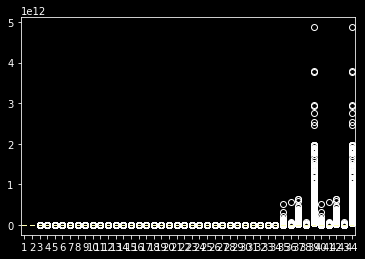

In [19]:
plt.boxplot(data)

In [20]:
dataset.corr()

,label,n_transactions,block_height_max-min,fee_mean,fee_median,fee_std,fee_min,fee_max,fee_max-min,size_mean,...,inputsAmount_mean,inputsAmount_median,inputsAmount_std,inputsAmount_min,inputsAmount_max,outputsAmount_mean,outputsAmount_median,outputsAmount_std,outputsAmount_min,outputsAmount_max
label,1.000000,-0.034653,-0.074947,-0.115197,-0.095545,-0.124081,-0.000695,-0.122262,-0.122260,0.133736,...,-0.102235,-0.048415,-0.089760,-0.054949,-0.083667,-0.100910,-0.045851,-0.089900,-0.047241,-0.083625
n_transactions,-0.034653,1.000000,0.290099,0.030475,-0.121342,0.041410,-0.216562,0.052208,0.052297,0.044862,...,0.037097,-0.029650,0.090776,-0.120820,0.194713,0.038686,-0.026147,0.090500,-0.112389,0.194701
block_height_max-min,-0.074947,0.290099,1.000000,0.018677,-0.011582,0.024032,-0.207750,0.027346,0.027432,0.117671,...,0.073277,-0.019377,0.102561,-0.106186,0.133713,0.073649,-0.018556,0.102525,-0.108102,0.133707
fee_mean,-0.115197,0.030475,0.018677,1.000000,0.043674,0.947273,-0.016343,0.858477,0.858474,0.058631,...,0.153294,0.012484,0.137808,-0.007729,0.114216,0.151762,0.012227,0.137213,-0.008412,0.113899
fee_median,-0.095545,-0.121342,-0.011582,0.043674,1.000000,0.015611,0.280370,-0.001419,-0.001535,0.361773,...,0.096407,0.100610,0.048467,0.102018,0.021074,0.095842,0.099421,0.048556,0.098305,0.021073
fee_std,-0.124081,0.041410,0.024032,0.947273,0.015611,1.000000,-0.026324,0.966597,0.966596,0.047101,...,0.168803,0.006565,0.167724,-0.011375,0.148684,0.167340,0.006323,0.167135,-0.012049,0.148386
fee_min,-0.000695,-0.216562,-0.207750,-0.016343,0.280370,-0.026324,1.000000,-0.029045,-0.029460,0.077857,...,0.001316,0.089433,-0.050819,0.279383,-0.068905,0.000890,0.088420,-0.050726,0.274956,-0.068897
fee_max,-0.122262,0.052208,0.027346,0.858477,-0.001419,0.966597,-0.029045,1.000000,1.000000,0.037623,...,0.163358,0.003005,0.170591,-0.012292,0.156036,0.162033,0.002794,0.170044,-0.012824,0.155766
fee_max-min,-0.122260,0.052297,0.027432,0.858474,-0.001535,0.966596,-0.029460,1.000000,1.000000,0.037590,...,0.163355,0.002968,0.170610,-0.012408,0.156063,0.162030,0.002758,0.170063,-0.012938,0.155792
size_mean,0.133736,0.044862,0.117671,0.058631,0.361773,0.047101,0.077857,0.037623,0.037590,1.000000,...,0.108341,0.112975,0.064880,0.043731,0.058329,0.107453,0.111171,0.064998,0.038263,0.058321


In [24]:
data = np.array(data) #that al
KM = KMeans (5)
KM.fit(data)
y_pred=KM.predict(data)
y_pred

array([0, 0, 0, ..., 0, 2, 0])

In [26]:
centers = KM.cluster_centers_
labels  = KM.labels_
inertial= KM.inertia_
iteration=KM.n_iter_

In [27]:
centers

array([[2.58892375e+00, 6.07378137e+01, 3.17328527e+04, 1.22050060e+06,
        2.11741229e+05, 2.44992962e+06, 2.85778678e+04, 1.12905568e+07,
        1.12619789e+07, 7.82286159e+03, 4.75765088e+03, 1.02316871e+04,
        6.48317568e+02, 3.37642131e+04, 2.80324937e+04, 1.68309129e+04,
        3.61051643e+04, 2.43789973e+03, 1.19227159e+05, 1.78017777e+05,
        1.79475302e+05, 9.55165965e+03, 1.57779117e+05, 1.89513296e+05,
        3.96230407e+01, 2.01861125e+01, 5.94457696e+01, 1.94160232e+00,
        1.94162886e+02, 4.01228103e+01, 2.35881998e+01, 5.13335139e+01,
        2.22043919e+00, 1.67226472e+02, 2.52133562e+09, 1.36541419e+09,
        3.76432961e+09, 2.37387732e+08, 1.60555282e+10, 2.53143021e+09,
        1.38121485e+09, 3.75683067e+09, 2.46290385e+08, 1.60502855e+10],
       [2.14285714e+00, 1.38803571e+02, 4.91478929e+04, 1.24699625e+07,
        2.72938455e+05, 3.57278755e+07, 3.92510714e+03, 2.22442613e+08,
        2.22438688e+08, 1.21144420e+04, 9.23089286e+03, 1.36283

In [28]:
labels

array([0, 0, 0, ..., 0, 2, 0])

In [29]:
inertial

4.831994898033989e+25

In [30]:
iteration

11

In [31]:
silhouette_Score = silhouette_score(data , labels)
print('Silutescore Score for KMean :: ',silhouette_Score)

Silutescore Score for KMean ::  0.8731074569341108


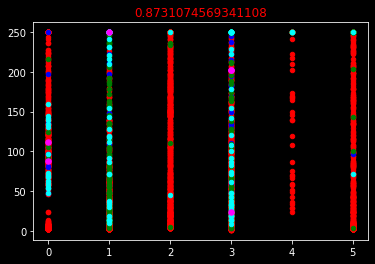

In [32]:
plt.title (silhouette_Score,color = 'red')
plt.scatter(data[y_pred == 0, 0], data[y_pred == 0, 1], s = 20, c = 'red', label = 'Cluster 1')
plt.scatter(data[y_pred == 1, 0], data[y_pred == 1, 1], s = 20, c = 'blue', label = 'Cluster 2')
plt.scatter(data[y_pred == 2, 0], data[y_pred == 2, 1], s = 20, c = 'green', label = 'Cluster 3')
plt.scatter(data[y_pred == 3, 0], data[y_pred == 3, 1], s = 20, c = 'cyan', label = 'Cluster 4')
plt.scatter(data[y_pred == 4, 0], data[y_pred == 4, 1], s = 30, c = 'magenta', label = 'Cluster 5')
plt.show()
